<a href="https://colab.research.google.com/github/amiralv82/feature-matching-and-stitching/blob/main/image_stitching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro
<font face="Times New Roman" size=4>


<hr>
<div dir="ltr">
<H> Comparison of SIFT and ORB Feature Extraction Methods <H>


In this section, we compare two feature extraction methods: SIFT and ORB. The goal is to evaluate their performance and compare them in terms of the number of extracted features, execution time, and accuracy.

Theoretical Explanation:

SIFT (Scale-Invariant Feature Transform) Method:
1.	Difference of Gaussian (DoG):

	*	This method detects keypoints by computing the difference between Gaussian blurs at different scales.
	*	The goal of this step is to find points that are resistant to changes in scale, rotation, and illumination.
2.	Keypoint Descriptor:
	*	Descriptors are generated using local gradient directions.
	*	These descriptors are used for precise matching between images.

ORB (Oriented FAST and Rotated BRIEF) Method:
1.	FAST (Features from Accelerated Segment Test):
	*	Quickly and accurately detects keypoints.
	*	Unlike SIFT, it requires less computation.
2.	BRIEF (Binary Robust Independent Elementary Features):
	*	Generates binary descriptors that are faster than SIFT descriptors.
	*	This method is more suitable for real-time applications.

---

1. Difference of Gaussian (DoG) in SIFT:

What is it used for?

Difference of Gaussian (DoG) is a core step in the SIFT algorithm used for detecting keypoints. Its purpose:
*	To identify points in the image that are stable under scale and rotation changes.
*	DoG does this by analyzing points that have unique characteristics (like corners and sharp edges) across different image scales.

How is it used?
1.	Create Gaussian images at different scales:
	*	The original image is filtered with Gaussian filters (with various σ values) to produce multiple versions of the image.
	*	σ represents the degree of blurring; higher σ means more blur.
2.	Compute the Difference of Gaussian (DoG):
	*	The difference between two Gaussian images with different σ values is calculated:

$$DoG(x, y, σ) = G(x, y, kσ) - G(x, y, σ)$$

where $G(x, y, σ)$ is the Gaussian image, and k is a constant factor for scale change.
3.	Detect keypoint candidates (Extremum Detection):
	*	Each pixel in the DoG image is compared with its neighbors in different scales.
	*	Pixels that are local maxima or minima in their neighborhood across scales are selected as keypoints.

---

2. Keypoint Descriptor in SIFT:

What is it used for?

The Keypoint Descriptor in the SIFT algorithm is used to represent local features around keypoints. The main goal of this descriptor is to:
*	Be invariant to changes in lighting, scale, and rotation.
*	Enable accurate matching of features between different images.

How are they determined?
1.	Orientation assignment:
	*	For each keypoint, a histogram of gradient directions in a local region is computed.
	*	Gradients consist of direction (angle) and magnitude.
	*	The dominant orientation (the direction with the highest histogram value) is assigned to the keypoint.
2.	Divide the region into sub-regions:
	*	A 16x16 pixel region around the keypoint is selected.
	*	This region is divided into 16 sub-regions of size 4x4.
3.	Compute the descriptor:
	*	For each sub-region, an orientation histogram with 8 bins is computed.
	*	In total, 4x4x8 = 128 values are created as the feature descriptor.
4.	Normalization and scaling:
	*	The 128-dimensional descriptor is normalized to be robust to changes in lighting.
	*	Each value in the descriptor is clipped to a specific range to reduce sensitivity to noise.

Why are these steps important?
*	DoG effectively identifies unique points in the image that are scale-invariant.
*	The Keypoint Descriptor enables accurate matching of keypoints across different images and is resistant to environmental changes such as rotation and illumination.

---

Comparison Steps:
1.	Feature Extraction:
	*	Using OpenCV, extract features of both algorithms on one or two images.
2.	Execution Time Comparison:
	*	Measure the execution time for each algorithm.
3.	Feature Matching:
	*	If using two images, compare the extracted features by matching them.
4.	Result Visualization:
	*	Display the extracted keypoints from each algorithm.

---

Code Execution

In the next cell, the code for comparing the two methods, SIFT and ORB, is provided.

# Import libraries and load the images

In [ ]:
import cv2
import numpy as np
import time
from google.colab.patches import cv2_imshow
from google.colab import files

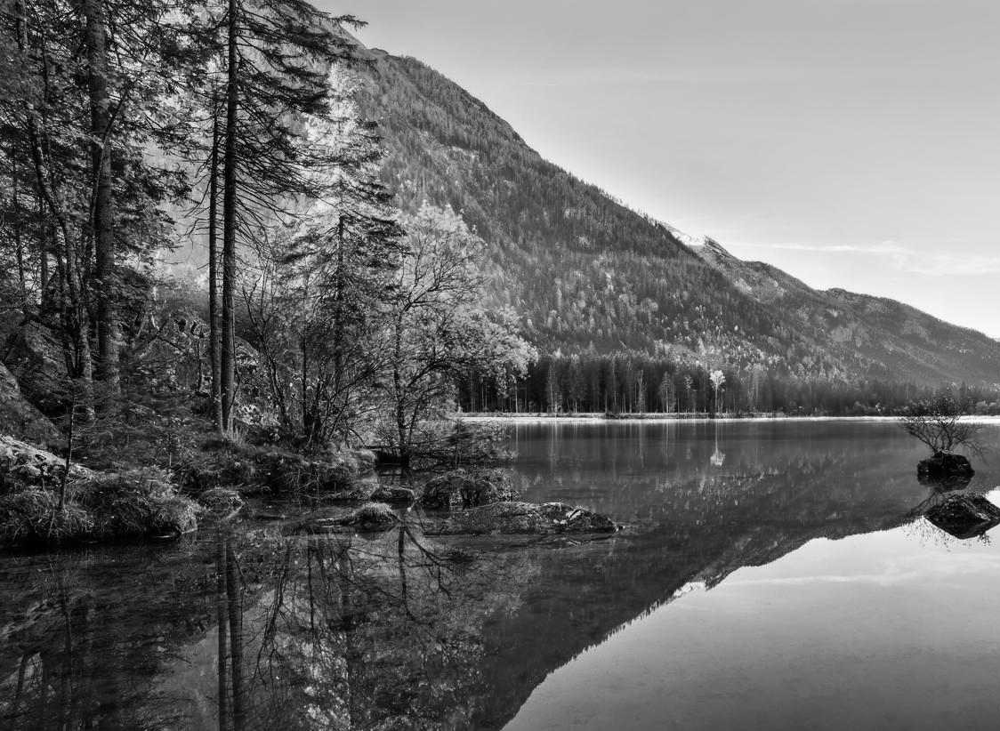

Image loaded successfully!


In [3]:
image_path = "image1.jpg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    print("Image not found. Please check the path.")
else:
    cv2_imshow(image)
    print("Image loaded successfully!")

# Features extraction using ORB and SIFT

SIFT: 9012 keypoints detected in 0.7303 seconds.
ORB: 500 keypoints detected in 0.0341 seconds.

SIFT Keypoints:


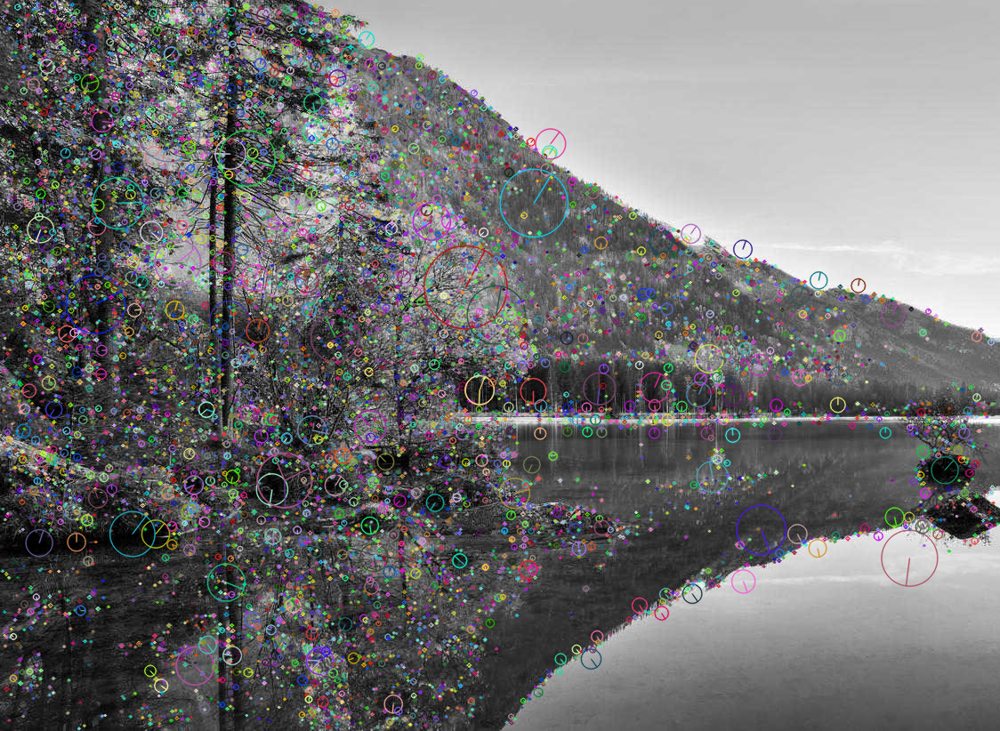


ORB Keypoints:


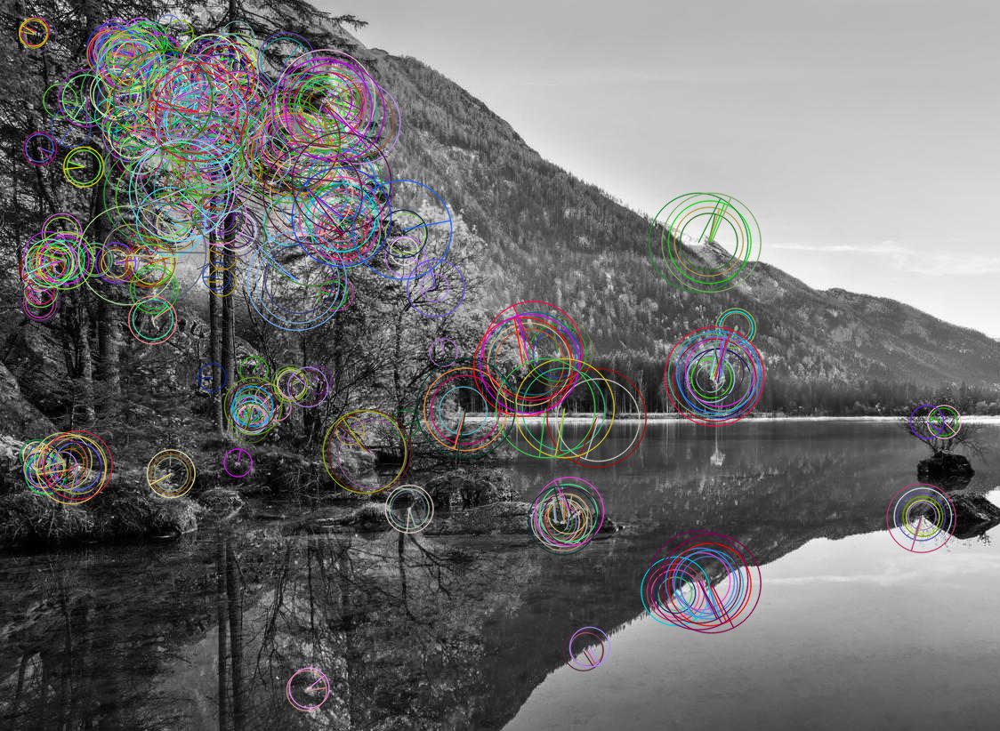


Comparison:
Number of keypoints: SIFT = 9012, ORB = 500
Execution time: SIFT = 0.7303s, ORB = 0.0341s


In [4]:
# Function to extract features using SIFT
def extract_sift(image):
    sift = cv2.SIFT_create()
    start_time = time.time()
    keypoints, descriptors = sift.detectAndCompute(image, None)
    end_time = time.time()
    return keypoints, descriptors, end_time - start_time

# Function to extract features using ORB
def extract_orb(image):
    orb = cv2.ORB_create()
    start_time = time.time()
    keypoints, descriptors = orb.detectAndCompute(image, None)
    end_time = time.time()
    return keypoints, descriptors, end_time - start_time

# Extract features using SIFT
sift_keypoints, sift_descriptors, sift_time = extract_sift(image)
print(f"SIFT: {len(sift_keypoints)} keypoints detected in {sift_time:.4f} seconds.")

# Extract features using ORB
orb_keypoints, orb_descriptors, orb_time = extract_orb(image)
print(f"ORB: {len(orb_keypoints)} keypoints detected in {orb_time:.4f} seconds.")

# Draw keypoints on the image for visualization
sift_image = cv2.drawKeypoints(image, sift_keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
orb_image = cv2.drawKeypoints(image, orb_keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


# Compare results
print("\nSIFT Keypoints:")
cv2_imshow(sift_image)

print("\nORB Keypoints:")
cv2_imshow(orb_image)
print("\nComparison:")
print(f"Number of keypoints: SIFT = {len(sift_keypoints)}, ORB = {len(orb_keypoints)}")
print(f"Execution time: SIFT = {sift_time:.4f}s, ORB = {orb_time:.4f}s")

<font face="Times New Roman" size=4>


<hr>
<div dir="ltr">
As can be observed, the SIFT algorithm detects significantly more keypoints (approximately 20 times more) compared to the ORB algorithm. However, it performs this task about 15 times slower than ORB. Therefore, we can conclude that in situations where quickly finding general keypoints is a priority and fine details are not critical, the ORB algorithm performs better. On the other hand, if detailed detection and analysis are important, the SIFT algorithm offers better performance and accuracy, despite being slower.


# Step One
<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>Color images are converted to grayscale. This is done because feature extraction algorithms (such as SIFT) only require intensity information and do not need color information.</p>
</div>
</font>


Step 1: Grayscale conversion


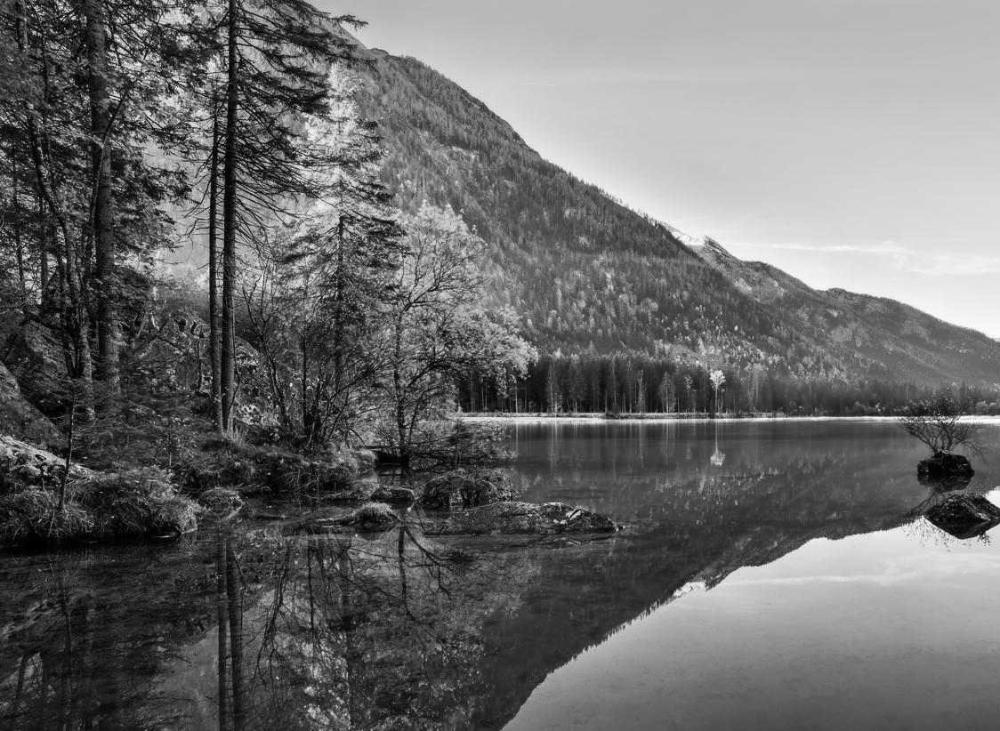

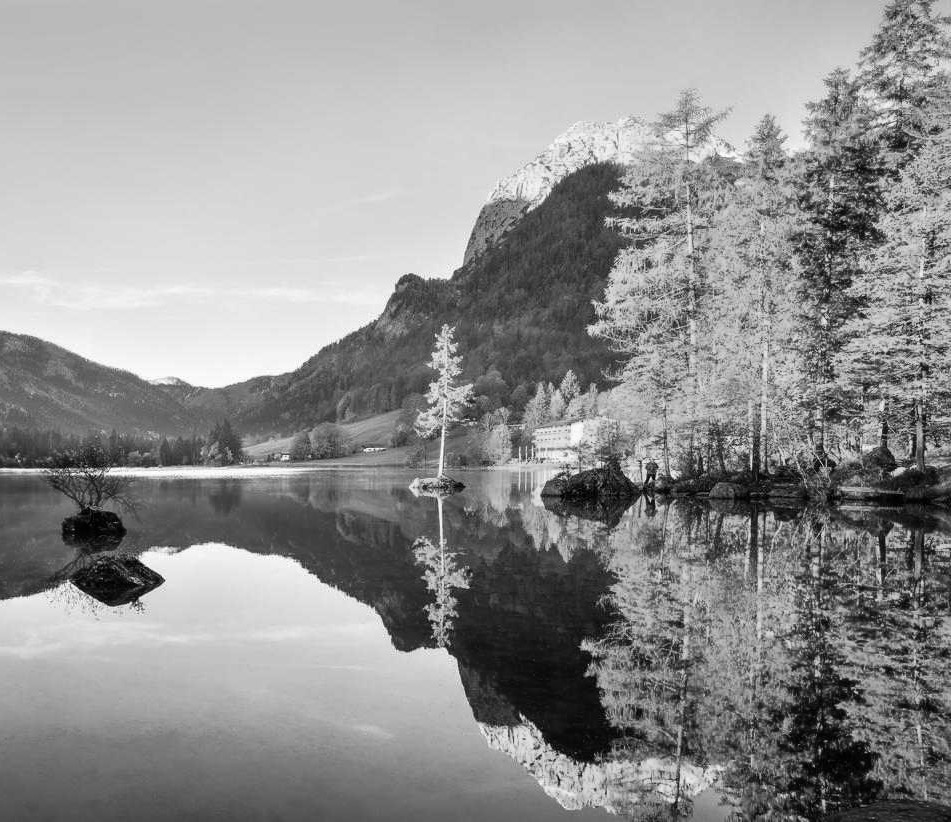

In [5]:
image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')

# Step 1: Convert images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

print("Step 1: Grayscale conversion")
cv2_imshow(gray1)
cv2_imshow(gray2)

#Step Two
<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>• SIFT (Scale-Invariant Feature Transform) identifies keypoints. These points are usually areas in the image with significant changes in intensity (such as corners or edges).</p>
    <p>• Then, a descriptor vector is created for each keypoint. This vector captures the characteristics of the region around the keypoint across different scales and rotations.</p>
</div>
</font>


Step 2: SIFT keypoints detection


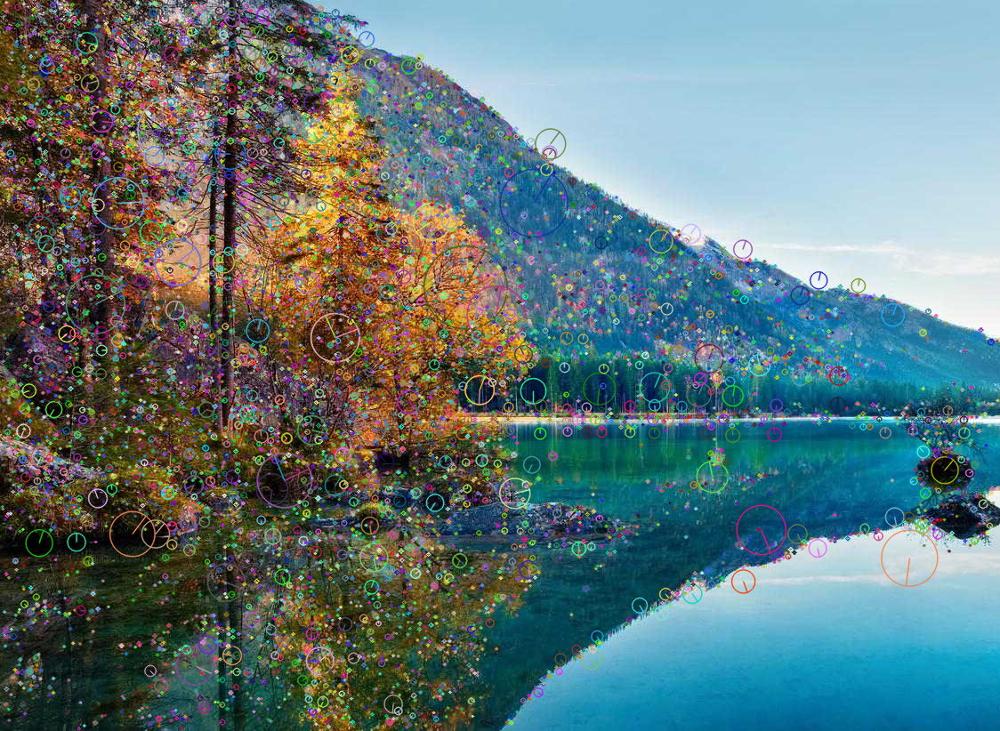

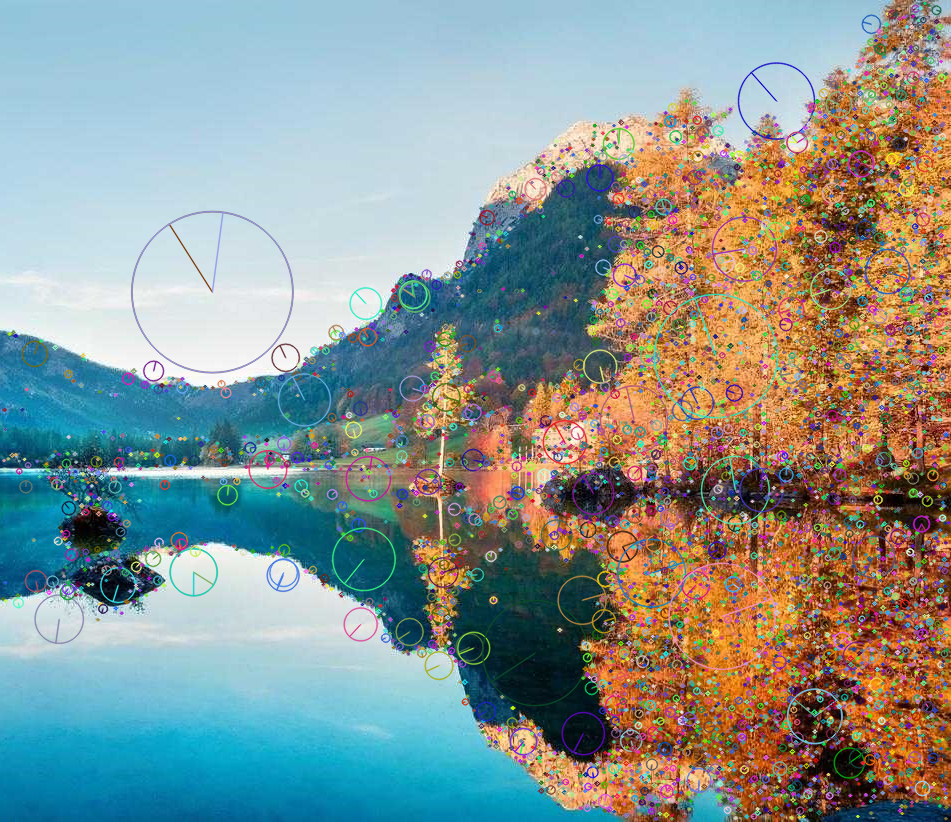

In [13]:
# Step 2: Extract features using SIFT
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

# Draw keypoints for visualization
image1_keypoints = cv2.drawKeypoints(image1, keypoints1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image2_keypoints = cv2.drawKeypoints(image2, keypoints2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print("Step 2: SIFT keypoints detection")
cv2_imshow(image1_keypoints)
cv2_imshow(image2_keypoints)

<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <h3>Importance of This Step</h3>
    <p>• Keypoints and descriptor vectors help us identify similar parts between two images (i.e., the locations where the images should align).</p>
</div>
</font>


# Step 3: Feature Matching Using FLANN
<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>• The extracted features from the first image are compared with the features from the second image.</p>
    <p>• FLANN (Fast Library for Approximate Nearest Neighbors) uses fast search methods to find the closest descriptor vectors between the two images.</p>
    <p>• The goal of this step is to identify similar points between the two images, which is essential for creating the homography matrix in the next step.</p>
</div>
</font>


In [7]:
# Step 3: Match features using FLANN-based matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Step 4: Applying Lowe's Ratio Test to Find Good Matches
<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>• For each matched feature, Lowe's test checks whether the selected match is truly accurate. This is done by comparing the distance of the closest match to the distance of the second-closest match.</p>
    <p>• This step helps eliminate incorrect matches and ensures that only reliable matches are used in the following steps.</p>
</div>
</font>


Step 4: Feature matching


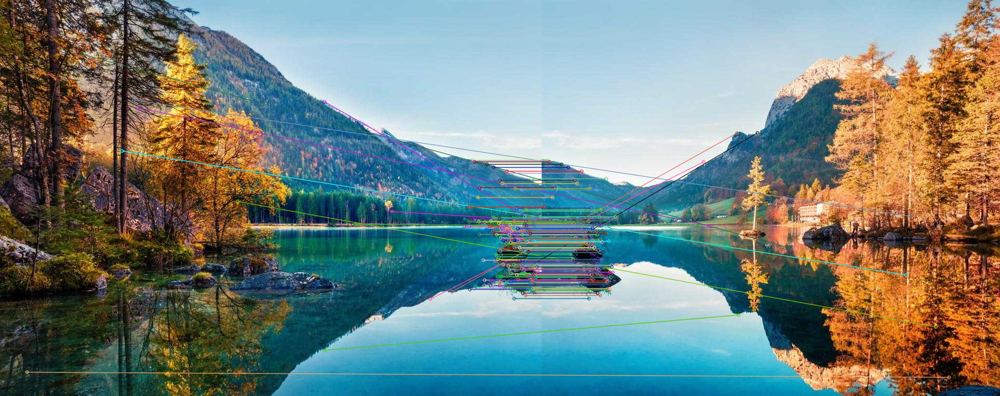

In [8]:
#Step 4: Apply Lowe's ratio test to find good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Draw matches for visualization
matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
print("Step 4: Feature matching")
cv2_imshow(matched_image)

# Step 5: Computing the Homography Matrix

<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>• The homography matrix is computed. This matrix represents a geometric transformation that maps the positions of keypoints from the first image to their corresponding positions in the second image.</p>
    <p>• The RANSAC (Random Sample Consensus) method is used to eliminate incorrect matches.</p>
    <p>• The homography matrix is then used to warp the first image and align it with the second image.</p>
</div>
</font>


In [9]:
# Step 5: Find homography
if len(good_matches) > 4:
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    print("Step 4: Homography matrix")
    print(H)
else:
    print("Not enough matches found - {}/{}".format(len(good_matches), 4))

Step 4: Homography matrix
[[ 1.00061397e+00 -2.29135280e-04 -9.69509320e+02]
 [ 4.05323834e-04  9.99954779e-01 -2.85156757e-01]
 [ 5.72987764e-07 -6.94780443e-07  1.00000000e+00]]


<font face="B Mitra" size=4>


<hr>
<div dir="ltr">


<h3>Homography Matrix Analysis:</h3>
<p>
The resulting homography matrix is:


H = \begin{bmatrix}
1.00260622 & -0.000237725 & -971.440194 \\
0.001499911 & 1.00159664 & -1.295685 \\
0.000002656 & -0.000001227 & 1.000000
\end{bmatrix}

Analysis of the Homography Matrix Elements:

1. Elements related to scaling and rotation:
	*	$h_{11}$ and $h_{22}$:
	*	$h_{11}$ = 1.00260622: Slight scaling along the horizontal axis (x). The value being very close to 1 indicates minimal scaling.
	*	$h_{22}$ = 1.00159664: Slight scaling along the vertical axis (y). This also shows very minor change.

2. Elements related to shear:
	*	$h_{12}$ and $h_{21}$:
	*	$h_{12}$ = -0.000237725: Almost no shear along the x-axis.
	*	$h_{21}$ = 0.001499911: Negligible shear along the y-axis as well.

3. Elements related to translation:
	*	$h_{13}$ and $h_{23}$:
	*	$h_{13}$ = -971.440194: The image is translated 971 pixels to the left along the horizontal axis.
	*	$h_{23}$ = -1.295685: The image is shifted 1.3 pixels downward along the vertical axis.

4. Elements related to perspective:
	*	$h_{31}$ and $h_{32}$:
	*	$h_{31}$ = 0.000002656: Almost no perspective distortion along the x-axis.
	*	$h_{32}$ = -0.000001227: Negligible perspective distortion along the y-axis as well.

5. Normalization element:
	*	$h_{33}$ = 1.0: This value is always 1 and is used for normalization purposes.

---

Conclusion:

This homography matrix allows us to transform the first image appropriately so that it aligns with the second image. The large translation along the x-axis indicates that the images need significant horizontal adjustment. Also, the minor changes in scale and perspective reflect the overall similarity between the two images.

</div>
</font>


# Step 6: Warping the First Image
<font face="B Mitra" size=4>


<hr>
<div dir="ltr">
    <p>• The first image is warped into a new space using the homography matrix. This process involves rotating, scaling, and translating the image.</p>
    <p>• The first image needs to be transformed so that it aligns correctly with the second image, and the overlapping region between the two images is properly matched.</p>
</div>
</font>


In [10]:
# Step 6: Warp image1 to align with image2
height1, width1 = image1.shape[:2]
height2, width2 = image2.shape[:2]

# Define the corners of image1 and transform them using the homography
corners_image1 = np.float32([[0, 0], [0, height1], [width1, height1], [width1, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(corners_image1, H)

# Define the corners of image2
corners_image2 = np.float32([[0, 0], [0, height2], [width2, height2], [width2, 0]]).reshape(-1, 1, 2)

# Combine corners of both images to find the overall bounding box
all_corners = np.vstack((warped_corners, corners_image2))
[x_min, y_min] = np.int32(all_corners.min(axis=0).ravel())
[x_max, y_max] = np.int32(all_corners.max(axis=0).ravel())

# Adjust the translation to fit everything into the canvas
translation_matrix = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]])

# Compute canvas size
canvas_width = x_max - x_min
canvas_height = y_max - y_min

# Warp image1 into the new canvas
result = cv2.warpPerspective(image1, translation_matrix @ H, (canvas_width, canvas_height))

Step 7: Final stitched image


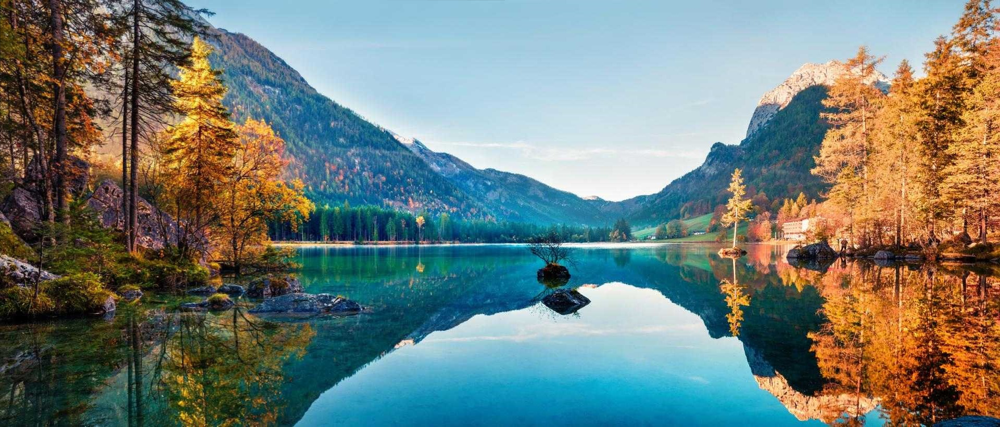

In [11]:
# Step 7: Place image2 in the canvas
result[-y_min:-y_min + height2, -x_min:-x_min + width2] = image2

print("Step 7: Final stitched image")
cv2_imshow(result)